# Wczytanie kanałów, kompozycje barwne i wskaźniki teledetekcyjne

In [1]:
import os

import matplotlib.pyplot as plt
import numpy as np
import rasterio as rio

from bands.basic_processing import BandProcessor
from bands.display import show_bands, show_band_index
from bands.load import LoadBands
from color_compositions import RGBBuilder
from cut_image_processor import CutBands
from indexes import get_ndvi, get_ndwi, get_sci
from save_data import SaveToTiff

In [2]:
PATH_DATA = './data'

### Wczytanie kanałów

In [3]:
files_full_images_list = os.listdir(PATH_DATA)

### Przycięcie obrazu

In [ ]:
# Funkcja przycinająca obraz -> w załączonym folderze data znajdują się już przycięte przeze mnie sceny
CutBands(files_full_images_list).get_cut();

In [4]:
PATH_RESIZE_DATA = './data'
files_list = os.listdir(PATH_RESIZE_DATA)
files_list

['clip_S2B_MSIL1C_20200914T095029_N0209_R079_T34UDC_20200914T111045_B07.tif',
 'clip_S2B_MSIL1C_20200914T095029_N0209_R079_T34UDC_20200914T111045_B08.tif',
 'clip_clc.tif',
 'clc_legend.csv',
 'clip_S2B_MSIL1C_20200914T095029_N0209_R079_T34UDC_20200914T111045_B03.tif',
 'clip_S2B_MSIL1C_20200914T095029_N0209_R079_T34UDC_20200914T111045_B02.tif',
 'clip_S2B_MSIL1C_20200914T095029_N0209_R079_T34UDC_20200914T111045_B06.tif',
 'clip_S2B_MSIL1C_20200914T095029_N0209_R079_T34UDC_20200914T111045_B05.tif',
 'clip_S2B_MSIL1C_20200914T095029_N0209_R079_T34UDC_20200914T111045_B11.tif',
 'clip_S2B_MSIL1C_20200914T095029_N0209_R079_T34UDC_20200914T111045_B8A.tif',
 'clip_S2B_MSIL1C_20200914T095029_N0209_R079_T34UDC_20200914T111045_B04.tif',
 'clip_S2B_MSIL1C_20200914T095029_N0209_R079_T34UDC_20200914T111045_B12.tif']

### Kompozycje barwne

Wykonam kilka kompozycji barwnych

In [5]:
bands_432 = ['B04', 'B03', 'B02']

my_bands_432 = LoadBands(files_list, bands_432).get_bands()
my_bands_432

['.//data/clip_S2B_MSIL1C_20200914T095029_N0209_R079_T34UDC_20200914T111045_B04.tif',
 './/data/clip_S2B_MSIL1C_20200914T095029_N0209_R079_T34UDC_20200914T111045_B03.tif',
 './/data/clip_S2B_MSIL1C_20200914T095029_N0209_R079_T34UDC_20200914T111045_B02.tif']

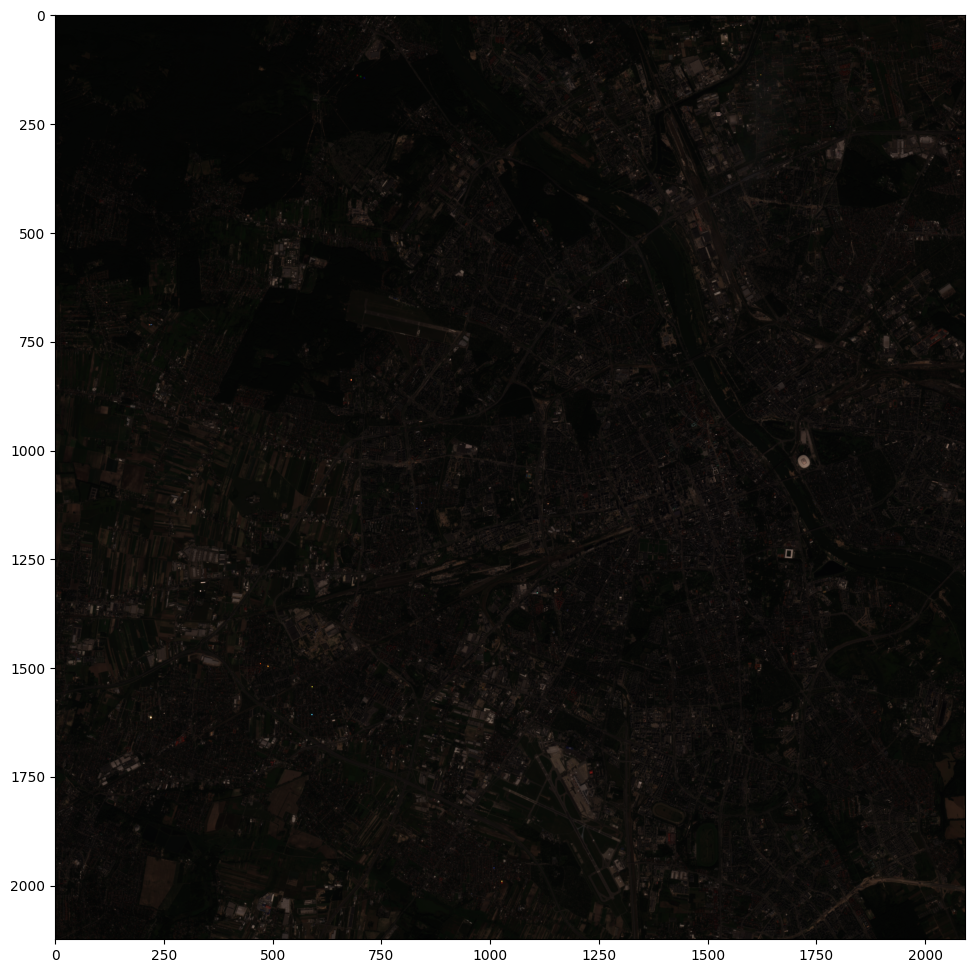

In [6]:
rgb = RGBBuilder(my_bands_432).get_rgb()
show_bands(rgb);

##### Jak widać obraz jest zbyt ciemny, wykonamy wstępne przetworzenie w celu zwiększenia kontrastu

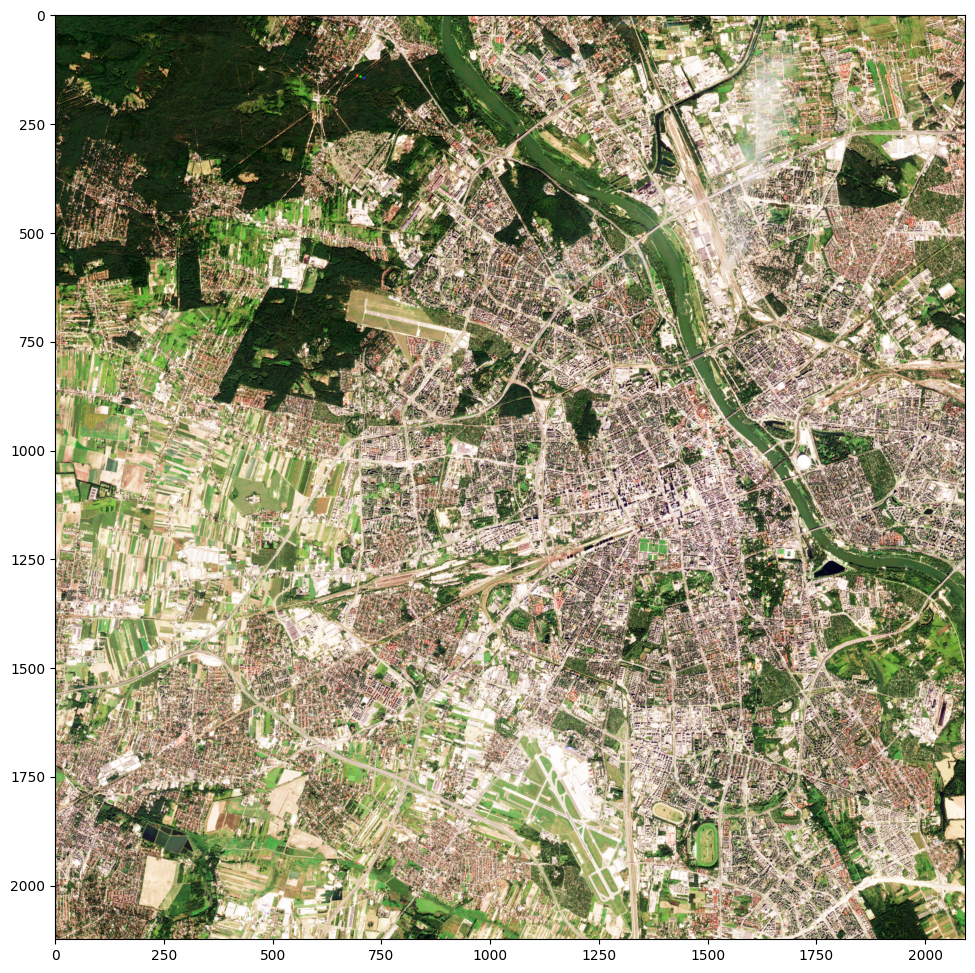

In [7]:
BandProcessor(rgb).show_processed_bands()

Kompozycja Fałszywe kolory:

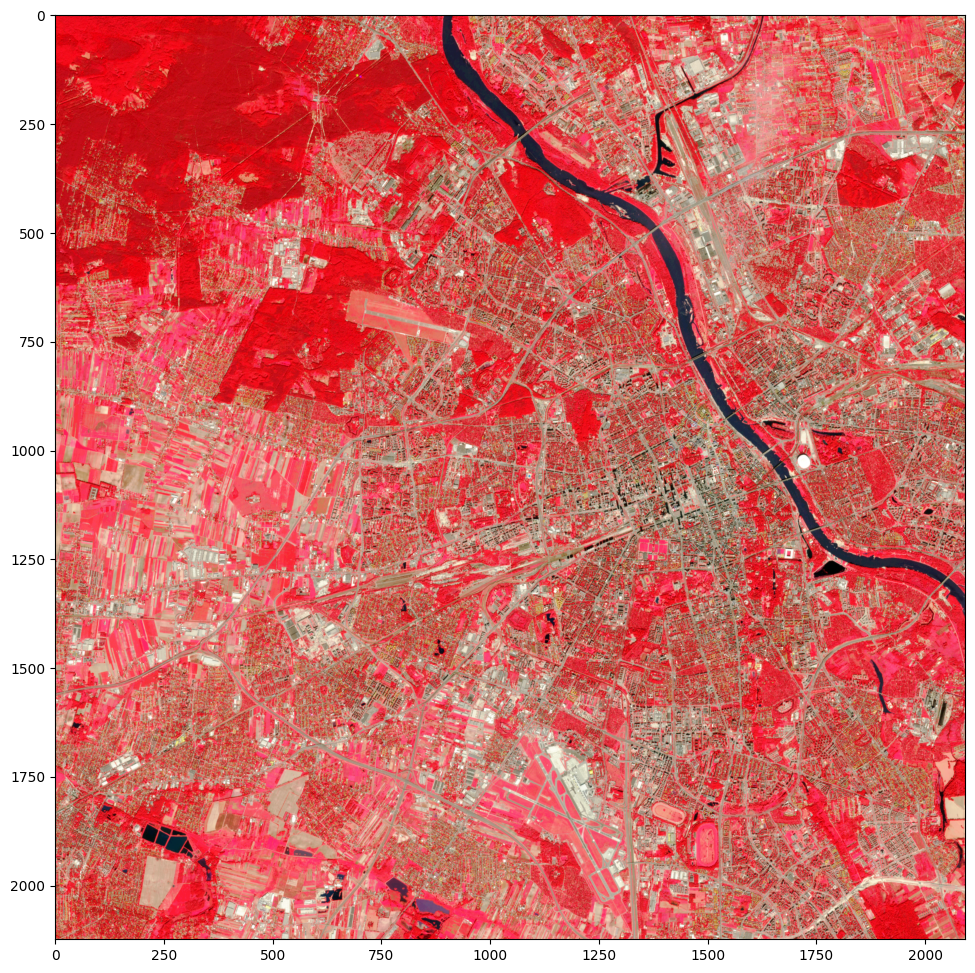

In [8]:
bands_843 = ['B08', 'B04', 'B03']

my_bands_843 = LoadBands(files_list, bands_843).get_bands()

rgb = RGBBuilder(my_bands_843).get_rgb()

BandProcessor(rgb).show_processed_bands()

Kompozycja Rolnictwo:

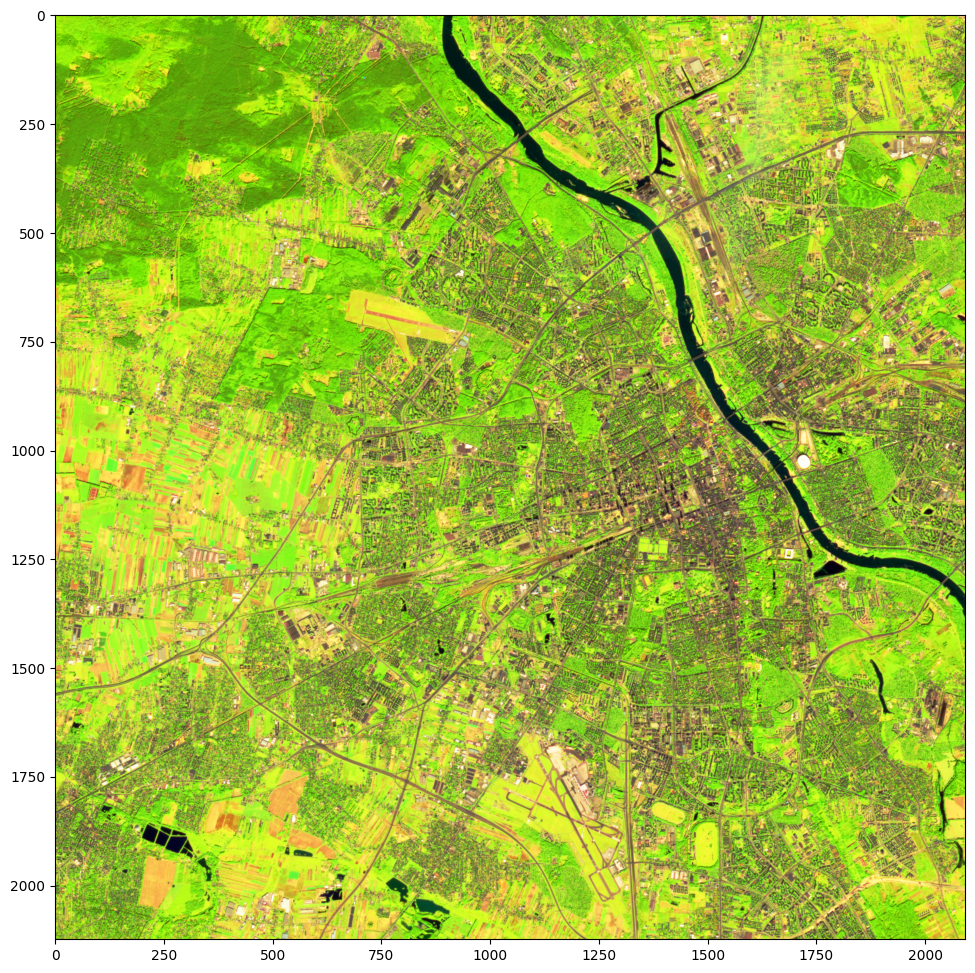

In [9]:
bands_1182 = ['B11', 'B08', 'B02']

my_bands_1182 = LoadBands(files_list, bands_1182).get_bands()

rgb = RGBBuilder(my_bands_1182).get_rgb()

BandProcessor(rgb).show_processed_bands()

Jeszcze jedna kompozycja:

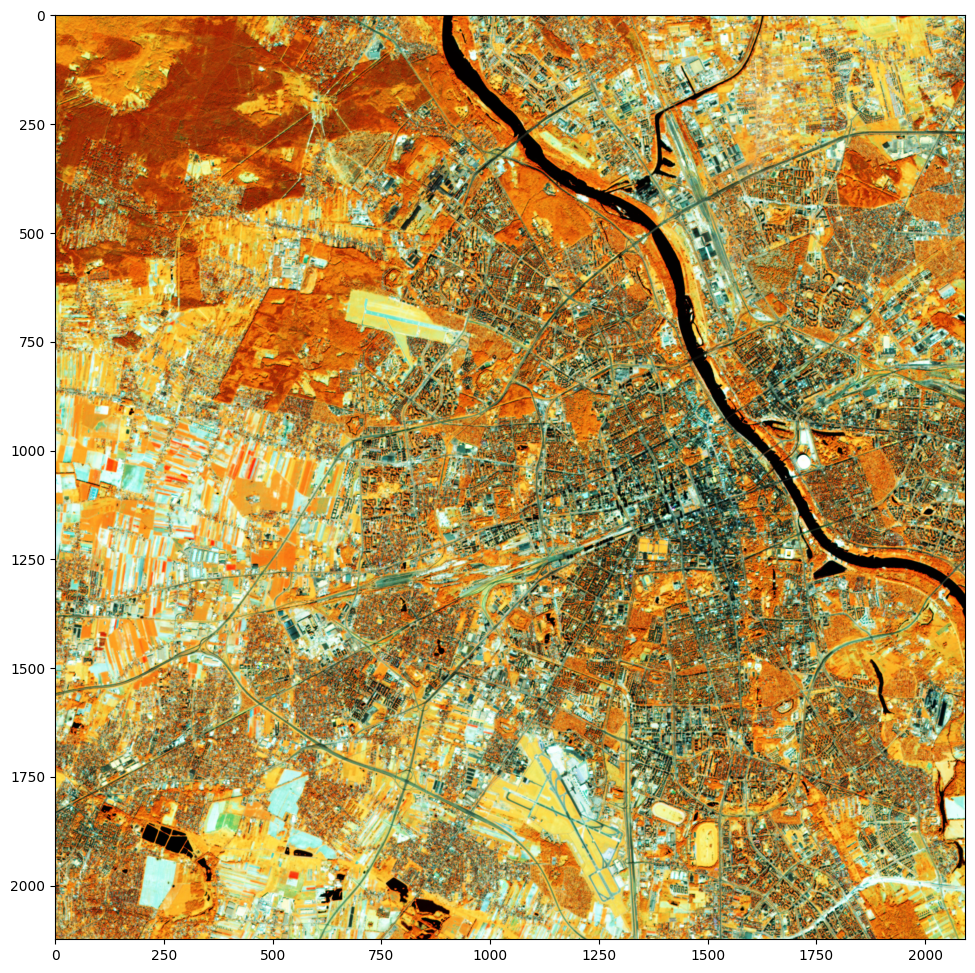

In [10]:
bands_81112 = ['B08', 'B11', 'B12']

my_bands_81112 = LoadBands(files_list, bands_81112).get_bands()

rgb = RGBBuilder(my_bands_81112).get_rgb()

BandProcessor(rgb).show_processed_bands()

### Obliczamy wskaźnik NDVI:

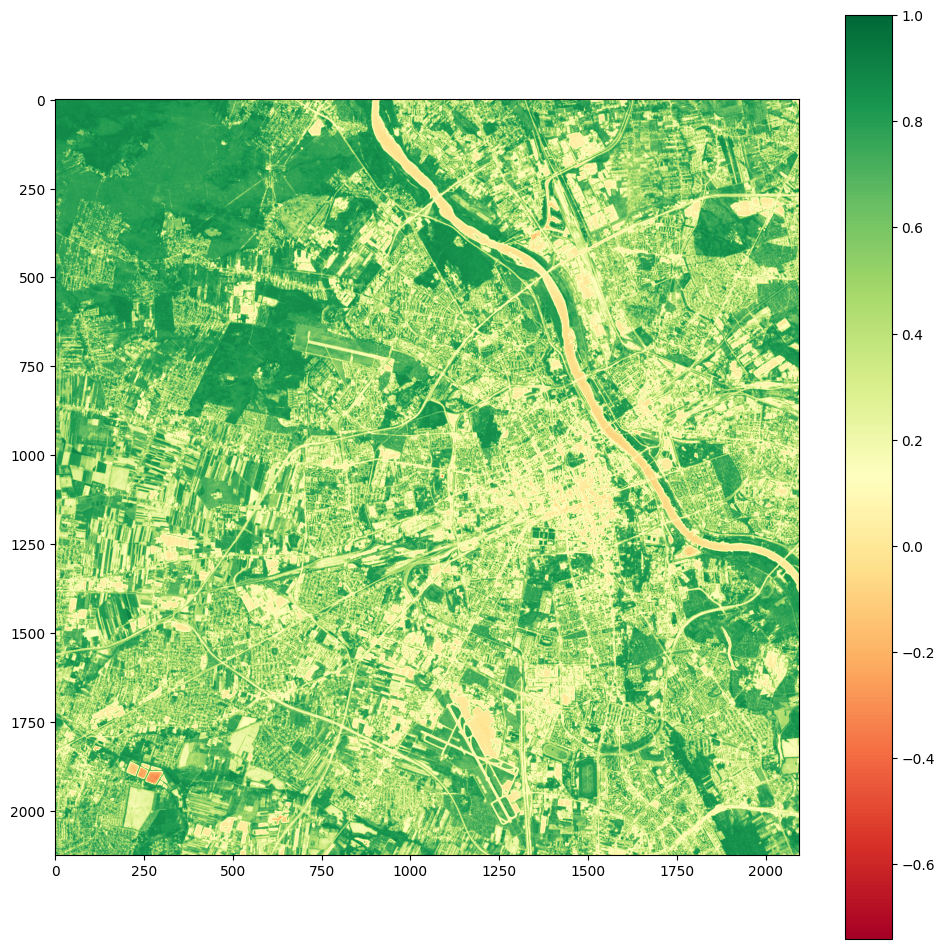

In [11]:
bands_ndvi = ['B04', 'B08']
ndvi_bands = LoadBands(files_list, bands_ndvi).get_bands()
ndvi = get_ndvi(*ndvi_bands)
show_band_index(ndvi, normalize=False, cmap='RdYlGn', cbar=True)

### Obliczamy wskaźnik NDWI:

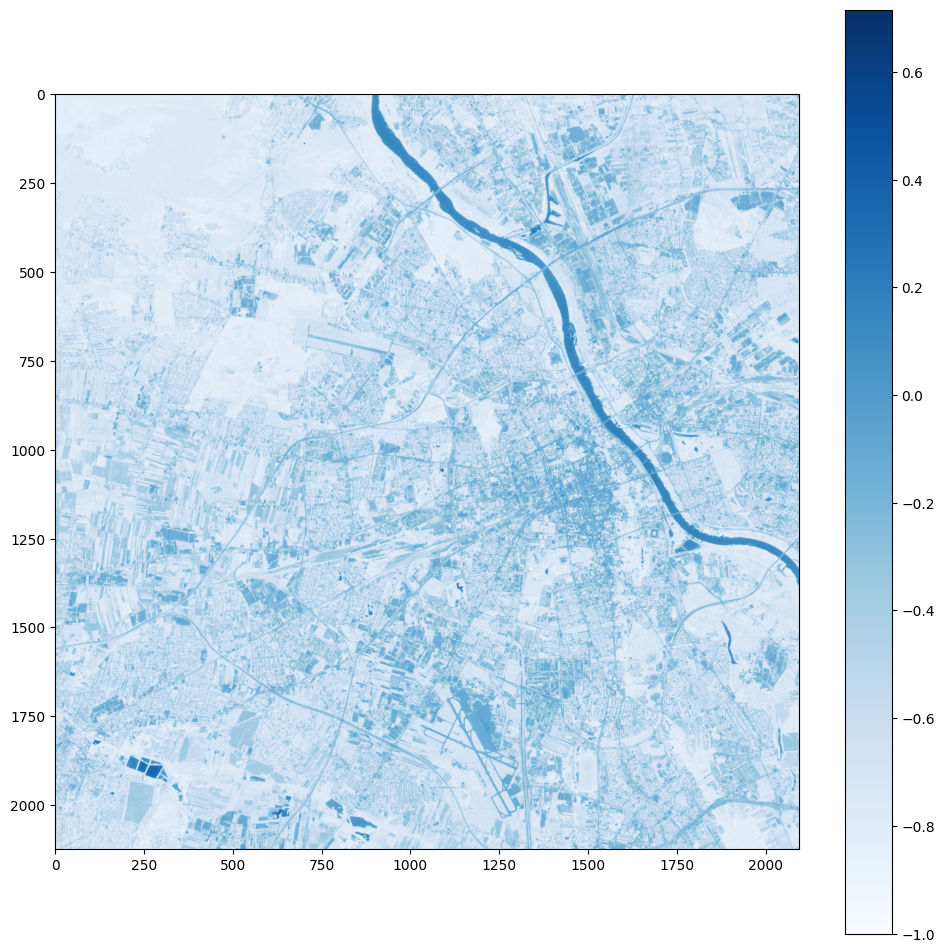

In [12]:
bands_ndwi = ['B03', 'B08']
ndwi_bands = LoadBands(files_list, bands_ndwi).get_bands()
ndwi = get_ndwi(*ndwi_bands)
show_band_index(ndwi, normalize=False, cmap='Blues', cbar=True)

### Obliczamy wskaźnik SCI:

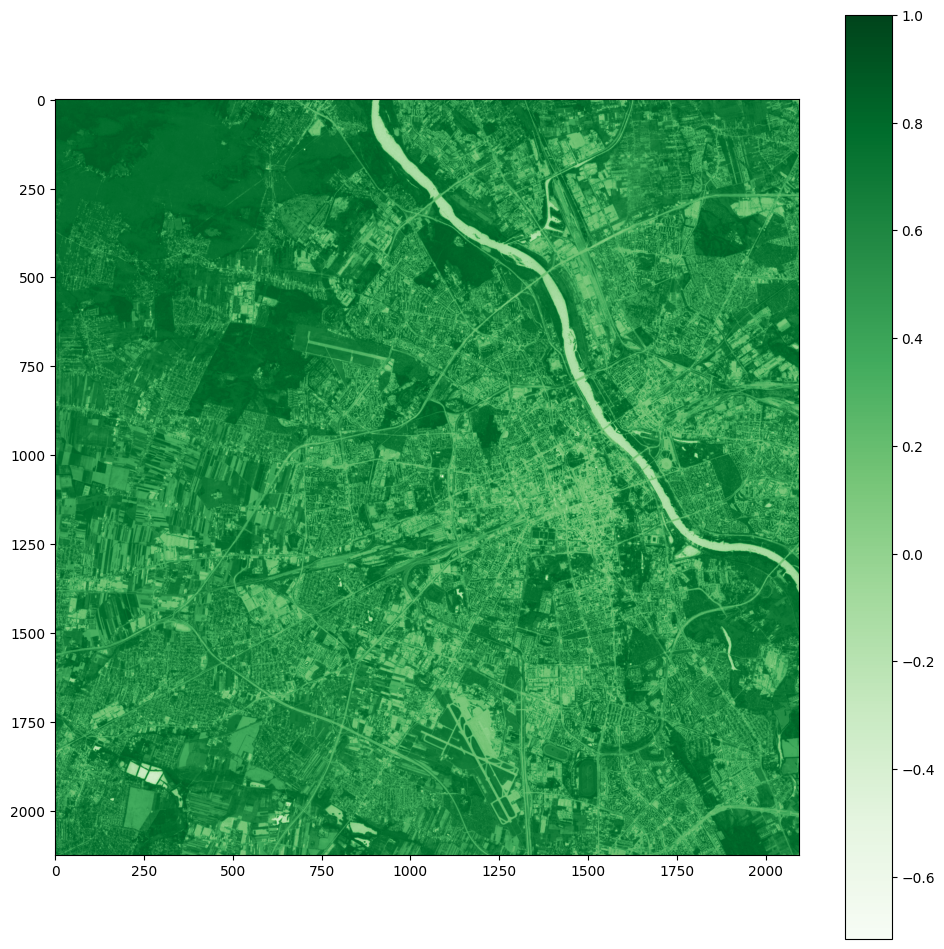

In [13]:
bands_sci = ['B08', 'B11']
sci_bands = LoadBands(files_list, bands_ndwi).get_bands()
sci = get_sci(*sci_bands)
show_band_index(sci, normalize=False, cmap='Greens', cbar=True)

### Zapisujemy wszystkie obrazy do plików:


In [14]:
SaveToTiff(ndvi_bands, ndvi, 'results/ndvi.tif').save()
SaveToTiff(ndwi_bands, ndwi, 'results/ndwi.tif').save()
SaveToTiff(sci_bands, sci, 'results/sci.tif').save()